In [1]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import folium
import json

In [2]:
from dates import dates_2020

In [3]:
df_nta = pd.read_csv(f'../data/time_away_ntas_2020.csv')
df_nta.head(20)

,NTA,2020-01-01,2020-01-02,2020-01-03,2020-01-04,2020-01-05,2020-01-06,2020-01-07,2020-01-08,2020-01-09,...,2020-08-22,2020-08-23,2020-08-24,2020-08-25,2020-08-26,2020-08-27,2020-08-28,2020-08-29,2020-08-30,2020-08-31
0,BK09,0.046617,0.054817,0.026034,0.021002,0.029457,0.021341,0.020344,0.029508,0.025848,...,0.024590,0.021834,0.023077,0.012397,0.024896,0.049793,0.021008,0.029787,0.043825,0.039841
1,BK17,0.016937,0.016754,0.011976,0.020650,0.021532,0.016587,0.014206,0.010217,0.014551,...,0.027516,0.026035,0.020684,0.024157,0.016894,0.026338,0.012853,0.032986,0.025790,0.016949
2,BK19,0.019725,0.016424,0.009633,0.016056,0.013844,0.009515,0.010436,0.012299,0.015242,...,0.023977,0.022844,0.018519,0.019094,0.016619,0.024362,0.009656,0.023941,0.020208,0.022778
3,BK21,0.023861,0.016732,0.012139,0.015864,0.018889,0.016716,0.014245,0.011276,0.012709,...,0.022442,0.031768,0.029762,0.023072,0.021636,0.023411,0.016880,0.030303,0.029614,0.023199
4,BK23,0.039604,0.019487,0.017021,0.043382,0.025078,0.010956,0.018538,0.020234,0.011628,...,0.036011,0.026201,0.026171,0.033505,0.025956,0.022788,0.010219,0.032258,0.033058,0.032215
5,BK25,0.026818,0.011144,0.010818,0.015539,0.012022,0.008726,0.012658,0.016285,0.016150,...,0.037897,0.025888,0.020337,0.019868,0.022622,0.022933,0.006803,0.030457,0.026775,0.024283
6,BK26,0.017964,0.012994,0.012717,0.020507,0.014698,0.017816,0.003505,0.008230,0.014363,...,0.025162,0.029806,0.036801,0.021633,0.022367,0.023121,0.013524,0.030506,0.035714,0.028494
7,BK27,0.017906,0.006608,0.011905,0.013582,0.011844,0.009055,0.009518,0.006289,0.009302,...,0.023626,0.026596,0.018182,0.025027,0.018334,0.025000,0.010770,0.025910,0.027140,0.023137
8,BK28,0.018465,0.010950,0.008554,0.016786,0.014100,0.008361,0.009144,0.012737,0.012558,...,0.024739,0.026393,0.022318,0.022249,0.025151,0.025616,0.011660,0.026875,0.035861,0.022894
9,BK29,0.022648,0.008985,0.009335,0.020565,0.011515,0.009223,0.009326,0.012141,0.006872,...,0.023082,0.022215,0.026010,0.026093,0.025536,0.025943,0.012302,0.025641,0.025240,0.027240


## Matplotlib - generate individual pngs by day

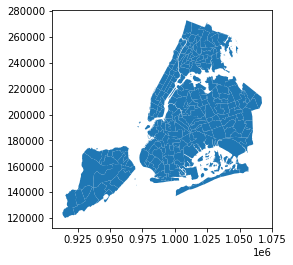

In [4]:
map_df = gpd.read_file(f'../data/shapefiles/nynta.shp')
map_df.plot()

In [5]:
merged = map_df.merge(df_nta,left_on='NTACode',right_on='NTA',how='left')
merged.head()

,BoroCode,BoroName,CountyFIPS,NTACode,NTAName,Shape_Leng,Shape_Area,geometry,NTA,2020-01-01,...,2020-08-22,2020-08-23,2020-08-24,2020-08-25,2020-08-26,2020-08-27,2020-08-28,2020-08-29,2020-08-30,2020-08-31
0,3,Brooklyn,047,BK88,Borough Park,39247.227831,5.400502e+07,"POLYGON ((990897.900 169268.121, 990588.252 16...",BK88,0.020629,...,0.025554,0.018592,0.021575,0.020533,0.026201,0.026130,0.012950,0.024167,0.019318,0.012920
1,4,Queens,081,QN51,Murray Hill,33266.904797,5.248828e+07,"POLYGON ((1038593.459 221913.355, 1039369.281 ...",QN51,0.019350,...,0.022857,0.021923,0.015595,0.019743,0.017946,0.019727,0.008854,0.025375,0.020155,0.019849
2,4,Queens,081,QN27,East Elmhurst,19816.711908,1.972685e+07,"POLYGON ((1022728.275 217530.808, 1023052.645 ...",QN27,0.021978,...,0.016818,0.013699,0.017196,0.016173,0.011796,0.012113,0.008130,0.010782,0.017094,0.015524
3,4,Queens,081,QN07,Hollis,20976.335574,2.288777e+07,"POLYGON ((1051539.660 201007.013, 1051920.726 ...",QN07,0.011607,...,0.020127,0.028659,0.010111,0.016546,0.014690,0.024339,0.010373,0.018805,0.015658,0.010176
4,3,Brooklyn,047,BK25,Homecrest,27514.022918,2.999197e+07,"POLYGON ((995746.857 161665.390, 995833.832 16...",BK25,0.026818,...,0.037897,0.025888,0.020337,0.019868,0.022622,0.022933,0.006803,0.030457,0.026775,0.024283


In [6]:
def map_timeaway(df,date_list):
    for date in date_list:
        # set the value column that will be visualised
        variable = date

        # create figure and axes for Matplotlib
        fig,ax = plt.subplots(1,figsize=(30,10))

        # remove the axis
        ax.axis('off')

        # add title and annotation
        ax.set_title(f'{date}', fontdict={'fontsize': '12', 'fontweight' : '3'})
        #ax.annotate('Source:XX', xy=(0.6, .05), xycoords='figure fraction', fontsize=12, color='#555555')

        # Create colorbar legend
        #mynorm = plt.Normalize(vmin=0.0, vmax=0.35)
        sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=0.0, vmax=0.3))

        # empty array for the data range
        sm.set_array([])

        # add the colorbar to the figure
        fig.colorbar(sm)

        # create map
        df.plot(column=variable,cmap='Blues',linewidth=0.8, ax=ax, edgecolor='0.8')
        
        #fig.savefig(f'output/dara/,maps/{date}.png', dpi=300)

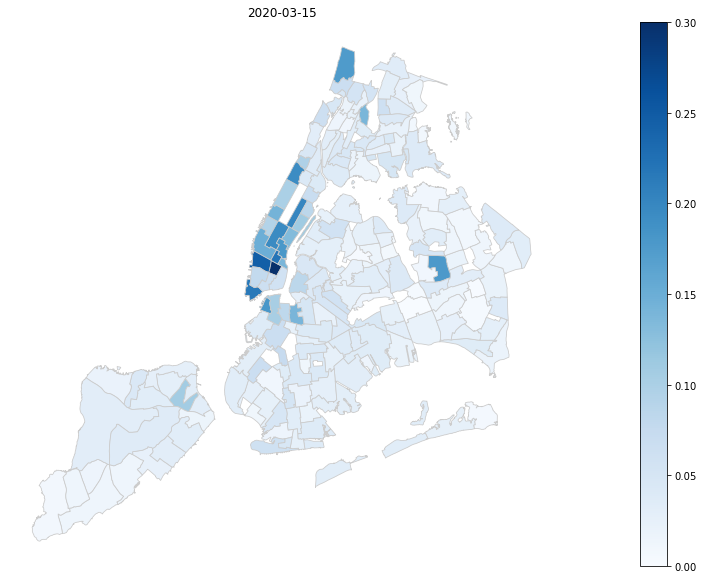

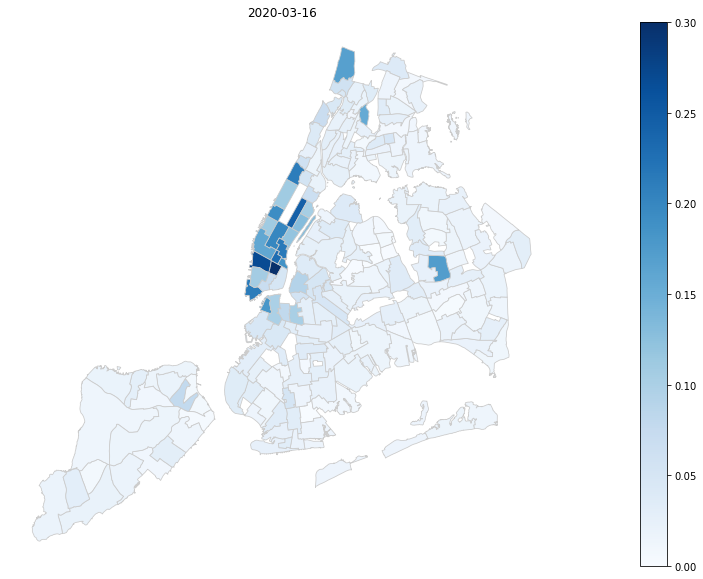

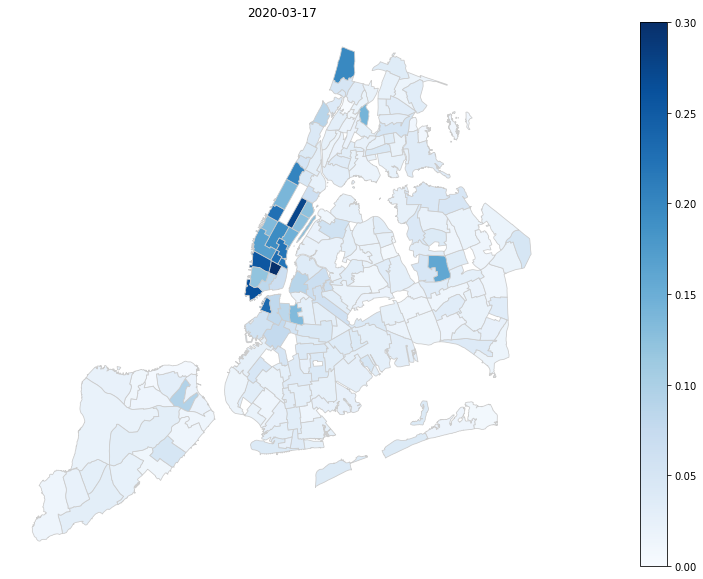

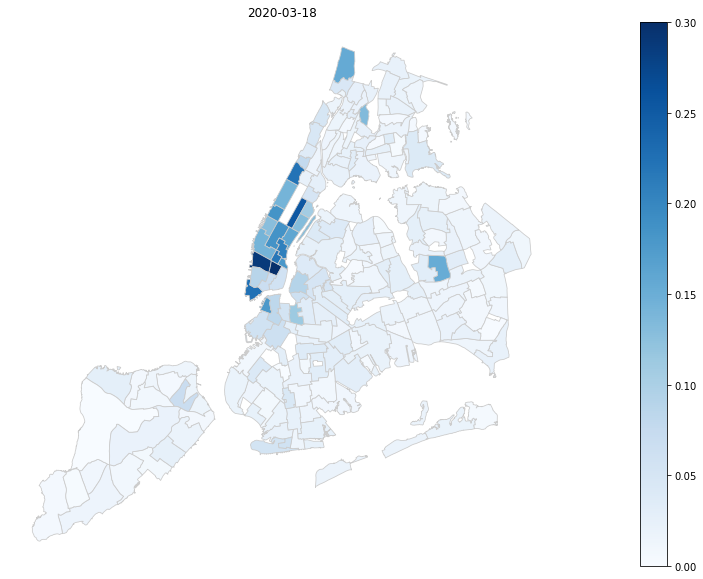

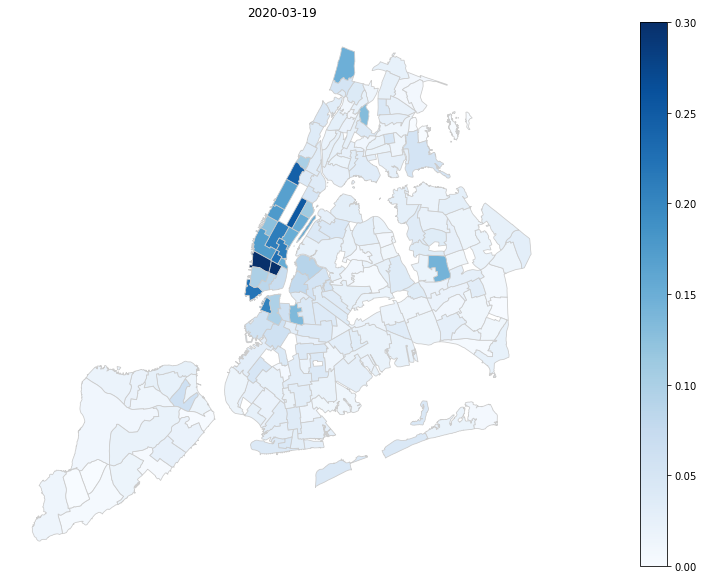

...

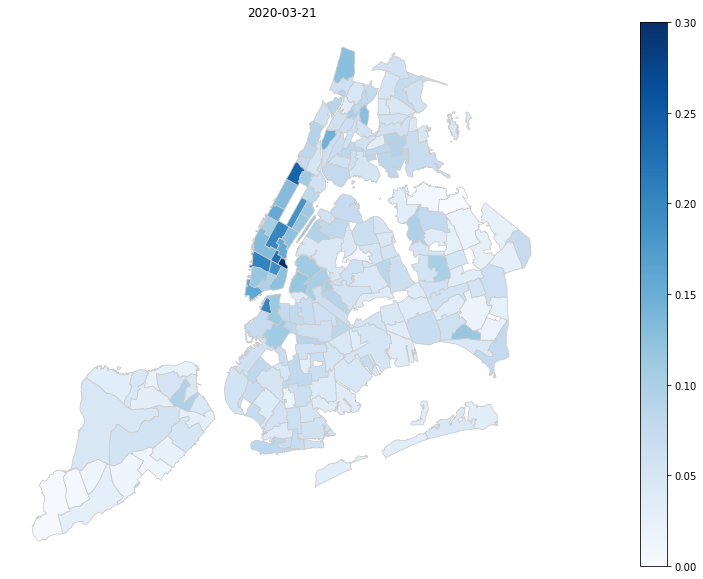

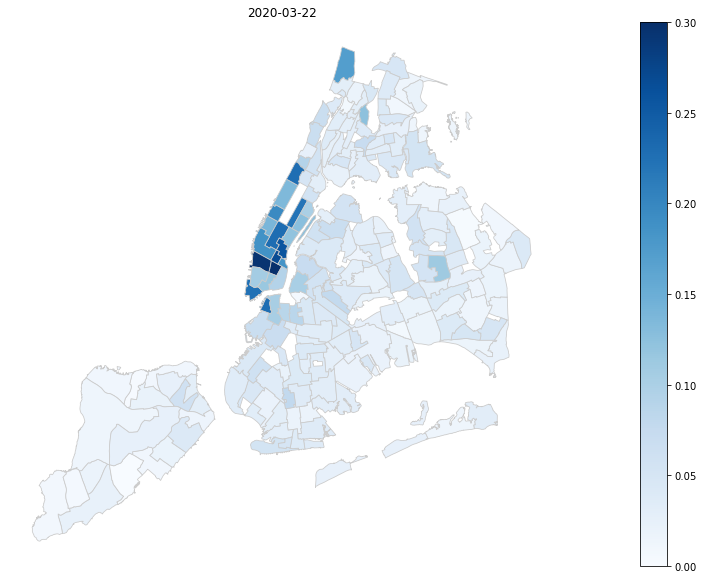

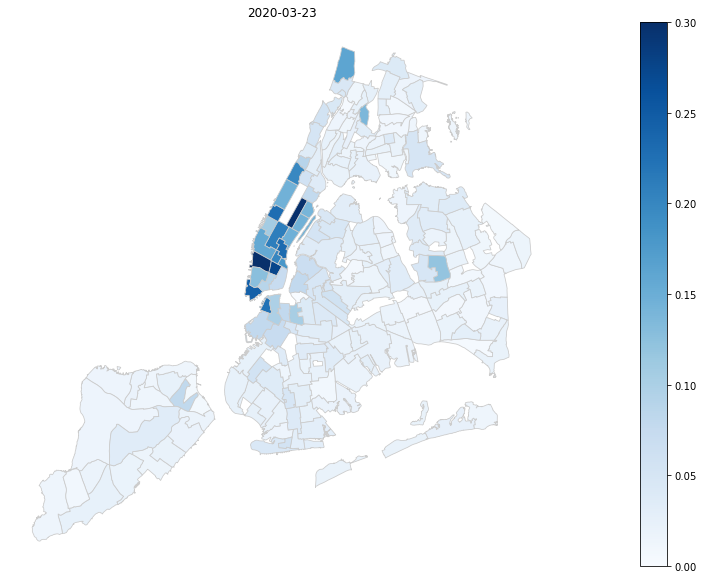

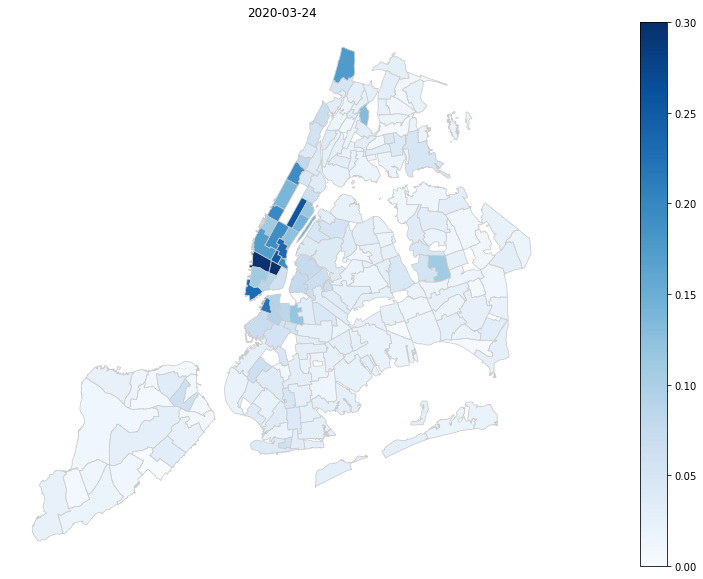

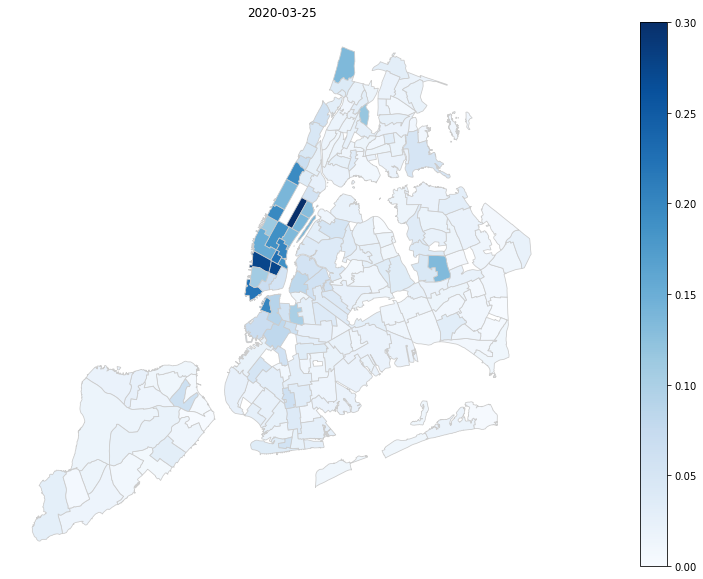

In [7]:
test_dates = ['2020-03-15','2020-03-16','2020-03-17','2020-03-18','2020-03-19','2020-03-20',\
             '2020-03-21','2020-03-22','2020-03-23','2020-03-24','2020-03-25']
map_timeaway(merged,test_dates)

## Folium 

In [8]:
nyc_nta_json_2 = gpd.read_file(f'../data/shapefiles/nynta.geojson')


In [9]:
nyc_nta_json_2.head(10)

,BoroCode,BoroName,CountyFIPS,NTACode,NTAName,Shape_Leng,Shape_Area,geometry
0,3,Brooklyn,047,BK88,Borough Park,39247.227831,5.400502e+07,"POLYGON ((990897.900 169268.121, 990588.252 16..."
1,4,Queens,081,QN51,Murray Hill,33266.904797,5.248828e+07,"POLYGON ((1038593.459 221913.355, 1039369.281 ..."
2,4,Queens,081,QN27,East Elmhurst,19816.711908,1.972685e+07,"POLYGON ((1022728.275 217530.808, 1023052.645 ..."
3,4,Queens,081,QN07,Hollis,20976.335574,2.288777e+07,"POLYGON ((1051539.660 201007.013, 1051920.726 ..."
4,3,Brooklyn,047,BK25,Homecrest,27514.022918,2.999197e+07,"POLYGON ((995746.857 161665.390, 995833.832 16..."
5,4,Queens,081,QN41,Fresh Meadows-Utopia,22106.431272,2.777485e+07,"POLYGON ((1045896.171 205383.934, 1045643.832 ..."
6,4,Queens,081,QN08,St. Albans,45401.316949,7.741275e+07,"POLYGON ((1052996.114 196307.361, 1053081.596 ..."
7,4,Queens,081,QN06,Jamaica Estates-Holliswood,35465.974926,4.278998e+07,"POLYGON ((1051684.884 203955.166, 1051683.111 ..."
8,3,Brooklyn,047,BK44,Madison,26237.257858,2.737916e+07,"POLYGON ((1001593.410 160996.441, 1001382.708 ..."
9,3,Brooklyn,047,BK41,Kensington-Ocean Parkway,20800.752357,1.589330e+07,"POLYGON ((992341.696 174770.869, 992361.536 17..."


#### test geojson file to make sure geographies look correct

In [10]:
map_geojson = folium.Map(location=[40.7137,-73.9675],tiles='cartodbpositron',zoom_start=10)
folium.GeoJson(nyc_nta_json_2,name='nycnta').add_to(map_geojson)

folium.LayerControl().add_to(map_geojson)

map_geojson

#### test choropleth map for test day

In [11]:
map_test = folium.Map(location=[40.7137,-73.9675],tiles='cartodbpositron',zoom_start=10)

In [12]:
test_day = '2020-03-26'

In [13]:
folium.Choropleth(geo_data=nyc_nta_json_2,name='choropleth',data=df_nta,\
                 columns=['NTA',test_day],key_on='feature.properties.NTACode',fill_color='BuGn',\
                 fill_opacity=0.7,line_opacity=0.2,legend_name='Pct away').add_to(map_test)

folium.LayerControl().add_to(map_test)

map_test